In [1]:
!mamba install -yq python-dotenv plotly

Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
cali_house_prices = pd.read_csv("data/california_housing_prices.csv")
cali_house_prices.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


## Converting Dollar Values

In [4]:
# median_income is initially measured in 10s of thousands, convert to dollars
#cali_house_prices["median_income"] = cali_house_prices["median_income"] * 10000
cali_house_prices["median_house_value"] = cali_house_prices["median_house_value"] / 100000
cali_house_prices["median_house_value"]

0        4.526
1        3.585
2        3.521
3        3.413
4        3.422
         ...  
20635    0.781
20636    0.771
20637    0.923
20638    0.847
20639    0.894
Name: median_house_value, Length: 20640, dtype: float64

In [5]:
def convert_dollars_2022(dollars):
    # According to https://www.officialdata.org/us/inflation/1990?endYear=2022&amount=1
    conversion = 2.24
    return dollars * conversion

In [6]:
# Convert income and value to 2022 dollars
cali_house_prices["income_2022_dollars"] = cali_house_prices["median_income"].apply(convert_dollars_2022)
cali_house_prices["value_2022_dollars"] = cali_house_prices["median_house_value"].apply(convert_dollars_2022)

In [7]:
cali_house_prices.rename(columns={
    "median_house_value": "value"
}, inplace=True)

cali_house_prices.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,value,ocean_proximity,income_2022_dollars,value_2022_dollars
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,4.526,NEAR BAY,18.648448,10.13824
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,3.585,NEAR BAY,18.595136,8.03040
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,3.521,NEAR BAY,16.256576,7.88704
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,3.413,NEAR BAY,12.640544,7.64512
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,3.422,NEAR BAY,8.615488,7.66528


## Making use of Latitude and Longitude

In [8]:
# Convert latitude and longitude into csv pair
cali_house_prices["lat_long_pair"] = cali_house_prices["latitude"].astype(str) + "," + cali_house_prices["longitude"].astype(str)
cali_house_prices["lat_long_pair"]

0        37.88,-122.23
1        37.86,-122.22
2        37.85,-122.24
3        37.85,-122.25
4        37.85,-122.25
             ...      
20635    39.48,-121.09
20636    39.49,-121.21
20637    39.43,-121.22
20638    39.43,-121.32
20639    39.37,-121.24
Name: lat_long_pair, Length: 20640, dtype: object

In [9]:
def reduce_lat_long(string):
    """
    Reduces latitude and longitude string pair to one decimal point each
    """
    latlng = string.split(",")
    lat = latlng[0]
    lng = latlng[1]

    lat = lat.split(".")
    lat = lat[0] + "." + lat[1][0]

    lng = lng.split(".")
    lng = lng[0] + "." + lng[1][0]
    return lat + "," + lng

In [10]:
# Reduce unique lat long pairs for calling geocode API for city info
cali_house_prices["lat_long_pair"] = cali_house_prices["lat_long_pair"].map(reduce_lat_long)

In [11]:
lat_long = cali_house_prices["lat_long_pair"].value_counts()
lat_long = lat_long.to_frame().reset_index()
lat_long

,lat_long_pair,count
0,"37.7,-122.4",469
1,"34.0,-118.3",420
2,"33.9,-118.2",394
3,"34.0,-118.2",330
4,"37.8,-122.2",292
...,...,...
1580,"39.2,-121.5",1
1581,"39.4,-121.0",1
1582,"39.9,-120.7",1
1583,"39.7,-120.6",1


In [12]:
import requests
import os
from dotenv import load_dotenv

# Requires API key "GEOCODE_API_KEY" set in .env for Google Maps Geocode API
load_dotenv()
API_KEY = os.getenv("GEOCODE_API_KEY")

def get_city(lat_long):
    """
    Given lat long csv pair, returns city or locality from Google Maps Geocode API
    """
    try:
        res = requests.get(f"https://maps.googleapis.com/maps/api/geocode/json?key={API_KEY}&latlng={lat_long}&result_type=locality")
        res.raise_for_status()
        res = res.json()
        print(res)
        return res["results"][0]["address_components"][0]["short_name"]
    except:
        return "None"

In [13]:
# Only need to run this once to create lat_long.csv
# lat_long["city"] = lat_long["lat_long_pair"].apply(get_city)
# lat_long.to_csv('data/lat_long.csv', index=False)

In [14]:
lat_long_city = pd.read_csv('data/lat_long.csv')
lat_long_city.head()

,lat_long_pair,count,city
0,"37.7,-122.4",469,Brisbane
1,"34.0,-118.3",420,Los Angeles
2,"33.9,-118.2",394,Compton
3,"34.0,-118.2",330,Vernon
4,"37.8,-122.2",292,Oakland


In [15]:
lat_long_city["city"].value_counts()

city
San Diego        9
Los Angeles      9
San Jose         5
Bakersfield      4
Hayfork          3
                ..
Moreno Valley    1
Lower Lake       1
Oroville East    1
Santa Venetia    1
Martinez         1
Name: count, Length: 275, dtype: int64

In [16]:
lat_long_city[lat_long_city.isna().any(axis=1)]

,lat_long_pair,count,city
28,"33.6,-117.9",154,NaN
34,"33.7,-118.1",131,NaN
41,"37.2,-121.8",113,NaN
42,"37.2,-121.9",110,NaN
45,"36.7,-119.7",106,NaN
...,...,...,...
1579,"39.2,-121.4",1,NaN
1580,"39.2,-121.5",1,NaN
1581,"39.4,-121.0",1,NaN
1582,"39.9,-120.7",1,NaN


In [17]:
lat_long_test = "39.7,-120.6"
# get_city(lat_long_test)

## Model evaluation code

In [18]:
# Full dataframe for modeling
df = cali_house_prices
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,value,ocean_proximity,income_2022_dollars,value_2022_dollars,lat_long_pair
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,4.526,NEAR BAY,18.648448,10.13824,"37.8,-122.2"
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,3.585,NEAR BAY,18.595136,8.03040,"37.8,-122.2"
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,3.521,NEAR BAY,16.256576,7.88704,"37.8,-122.2"
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,3.413,NEAR BAY,12.640544,7.64512,"37.8,-122.2"
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,3.422,NEAR BAY,8.615488,7.66528,"37.8,-122.2"


In [19]:
# train-test split: We are using train-test-split function from sklearn
from sklearn.model_selection import train_test_split
train_data, test_data = train_test_split(df, test_size=0.10)

In [20]:
data = train_data[~train_data.isna().any(axis=1)].copy()

In [21]:
# Model evaluation code adapted from Dr. Homayouni
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

# Phi is the feature engineering function
def evaluate_model(name, model, phi, models=dict()):
    # run the prediction function and compute the RMSE
    Yhat = model.predict(phi(data)).flatten()
    Y = data['value_2022_dollars'].to_numpy()
    rmse = np.sqrt(mean_squared_error(Y, Yhat))
    print("Root Mean Squared Error:", rmse)

    # Save the model and rmse to the collection of models
    models[name] = dict(model=model, phi=phi, rmse=rmse)

    # Generate diagnostic and model comparison plots
    fig = make_subplots(rows=1, cols=2)
    fig.add_trace(go.Scatter(x=Yhat, y=Y, mode="markers"), row=1, col=1)
    fig.update_xaxes(title = "Yhat", row=1, col=1)
    fig.update_yaxes(title = "Y", row=1, col=1)
    ymin = np.min(Yhat)
    ymax = np.max(Yhat)
    fig.add_trace(go.Scatter(x=[ymin,ymax], y=[ymin,ymax], name="y=yhat"), row=1, col=1)
    fig.add_trace(go.Bar(x=list(models.keys()),
                         y=[models[k]['rmse'] for k in models]), row=1, col=2)
    fig.update_layout(showlegend=False)
    fig.update_yaxes(title = "RMSE", row=1, col=2)
    fig.show()

models = {}

In [22]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income', 'value',
       'ocean_proximity', 'income_2022_dollars', 'value_2022_dollars',
       'lat_long_pair'],
      dtype='object')

In [23]:
original_df = df
original_df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,value,ocean_proximity,income_2022_dollars,value_2022_dollars,lat_long_pair
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,4.526,NEAR BAY,18.648448,10.13824,"37.8,-122.2"
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,3.585,NEAR BAY,18.595136,8.03040,"37.8,-122.2"
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,3.521,NEAR BAY,16.256576,7.88704,"37.8,-122.2"
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,3.413,NEAR BAY,12.640544,7.64512,"37.8,-122.2"
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,3.422,NEAR BAY,8.615488,7.66528,"37.8,-122.2"


In [24]:
original_df[original_df.isna().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,value,ocean_proximity,income_2022_dollars,value_2022_dollars,lat_long_pair
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,1.619,NEAR BAY,9.800000,3.62656,"37.7,-122.1"
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,0.851,NEAR BAY,3.627904,1.90624,"37.7,-122.1"
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,1.734,NEAR BAY,5.770688,3.88416,"37.7,-122.2"
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,4.9489,2.471,NEAR BAY,11.085536,5.53504,"37.7,-122.2"
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,1.784,NEAR BAY,8.750112,3.99616,"37.6,-122.1"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,2.205,NEAR OCEAN,7.483616,4.93920,"34.2,-119.1"
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,1.674,NEAR OCEAN,3.797472,3.74976,"34.1,-119.1"
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,5.1033,4.107,<1H OCEAN,11.431392,9.19968,"34.1,-118.8"
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,2.581,<1H OCEAN,14.800352,5.78144,"34.2,-118.7"


## Basic linear model on quantitative data

In [25]:
# Basic matrix adapted from Dr. Homayouni
def basic_design_matrix(df):
    X = df[['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'income_2022_dollars']]
    return X

basic_design_matrix(data)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars
14378,-117.28,32.73,44.0,1934.0,325.0,783.0,316.0,10.905216
4108,-118.37,34.13,28.0,4287.0,627.0,1498.0,615.0,19.191648
8328,-118.29,33.94,32.0,2701.0,708.0,1880.0,590.0,3.744384
5974,-117.76,34.11,22.0,4935.0,954.0,2874.0,938.0,8.920800
12097,-117.28,33.89,33.0,6982.0,1371.0,5650.0,1195.0,5.684896
...,...,...,...,...,...,...,...,...
16262,-121.25,37.95,40.0,1703.0,362.0,1208.0,373.0,4.663008
14818,-117.11,32.68,36.0,26.0,14.0,58.0,23.0,4.279968
12824,-121.44,38.73,25.0,1287.0,224.0,727.0,236.0,10.616704
12264,-116.87,33.76,5.0,4116.0,761.0,1714.0,717.0,5.737088


In [26]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(basic_design_matrix(data), data['value_2022_dollars'])
evaluate_model("basic", model, basic_design_matrix, models)

Root Mean Squared Error: 1.5571738642828654


## Basic Imputed

In [27]:
def basic_imputed_design_matrix(df):
    X = basic_design_matrix(df)
    X = X.fillna(X.mean())
    return X

basic_imputed_design_matrix(train_data)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars
14378,-117.28,32.73,44.0,1934.0,325.0,783.0,316.0,10.905216
4108,-118.37,34.13,28.0,4287.0,627.0,1498.0,615.0,19.191648
8328,-118.29,33.94,32.0,2701.0,708.0,1880.0,590.0,3.744384
5974,-117.76,34.11,22.0,4935.0,954.0,2874.0,938.0,8.920800
12097,-117.28,33.89,33.0,6982.0,1371.0,5650.0,1195.0,5.684896
...,...,...,...,...,...,...,...,...
16262,-121.25,37.95,40.0,1703.0,362.0,1208.0,373.0,4.663008
14818,-117.11,32.68,36.0,26.0,14.0,58.0,23.0,4.279968
12824,-121.44,38.73,25.0,1287.0,224.0,727.0,236.0,10.616704
12264,-116.87,33.76,5.0,4116.0,761.0,1714.0,717.0,5.737088


In [28]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(basic_imputed_design_matrix(train_data), train_data['value_2022_dollars'])
evaluate_model("basic_imputed", model, basic_imputed_design_matrix, models)

Root Mean Squared Error: 1.558027330325446


## Non-linear transformations on quantitative data

In [29]:
# Borrowed from Dr. Homayouni
def nonlinear_design_matrix(df):
    X = basic_design_matrix(df)
    exclude_cols = ['longitude', 'latitude']
    # Compute nonlinear transformations for each quantitative feature
    for col in X.columns:
        if col not in exclude_cols:
            X[f'{col}^2'] = X[f'{col}'] ** 2
            X[f'{col}^3'] = X[f'{col}'] ** 3
            X[f'log({col})'] = np.log(X[f'{col}'])
            X[f'sin({col})'] = np.sin(X[f'{col}'])
    return X

nonlinear_design_matrix(data)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars,housing_median_age^2,housing_median_age^3,...,log(population),sin(population),households^2,households^3,log(households),sin(households),income_2022_dollars^2,income_2022_dollars^3,log(income_2022_dollars),sin(income_2022_dollars)
14378,-117.28,32.73,44.0,1934.0,325.0,783.0,316.0,10.905216,1936.0,85184.0,...,6.663133,-0.676816,99856.0,3.155450e+07,5.755742,0.963787,118.923736,1296.889029,2.389241,-0.995920
4108,-118.37,34.13,28.0,4287.0,627.0,1498.0,615.0,19.191648,784.0,21952.0,...,7.311886,0.513875,378225.0,2.326084e+08,6.421622,-0.683218,368.319353,7068.655374,2.954475,0.335459
8328,-118.29,33.94,32.0,2701.0,708.0,1880.0,590.0,3.744384,1024.0,32768.0,...,7.539027,0.970572,348100.0,2.053790e+08,6.380123,-0.580562,14.020412,52.497805,1.320257,-0.566944
5974,-117.76,34.11,22.0,4935.0,954.0,2874.0,938.0,8.920800,484.0,10648.0,...,7.963460,0.528878,879844.0,8.252937e+08,6.843750,0.972609,79.580673,709.923264,2.188386,0.482913
12097,-117.28,33.89,33.0,6982.0,1371.0,5650.0,1195.0,5.684896,1089.0,35937.0,...,8.639411,0.988106,1428025.0,1.706490e+09,7.085901,0.930139,32.318043,183.724711,1.737813,-0.563230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16262,-121.25,37.95,40.0,1703.0,362.0,1208.0,373.0,4.663008,1600.0,64000.0,...,7.096721,0.998340,139129.0,5.189512e+07,5.921578,0.750967,21.743644,101.390784,1.539661,-0.998781
14818,-117.11,32.68,36.0,26.0,14.0,58.0,23.0,4.279968,1296.0,46656.0,...,4.060443,0.992873,529.0,1.216700e+04,3.135494,-0.846220,18.318126,78.400993,1.453946,-0.907954
12824,-121.44,38.73,25.0,1287.0,224.0,727.0,236.0,10.616704,625.0,15625.0,...,6.588926,-0.961414,55696.0,1.314426e+07,5.463832,-0.371432,112.714404,1196.655462,2.362429,-0.929083
12264,-116.87,33.76,5.0,4116.0,761.0,1714.0,717.0,5.737088,25.0,125.0,...,7.446585,-0.966079,514089.0,3.686018e+08,6.575076,0.657032,32.914179,188.831540,1.746952,-0.519356


In [30]:
model = LinearRegression()
model.fit(nonlinear_design_matrix(data), data['value_2022_dollars'])
evaluate_model("nonlinear", model, nonlinear_design_matrix, models)

Root Mean Squared Error: 1.4472726325686989


In [31]:
def nonlinear_imputed_design_matrix(df):
    X = nonlinear_design_matrix(df)
    X = X.fillna(X.mean())
    return X

nonlinear_imputed_design_matrix(train_data)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars,housing_median_age^2,housing_median_age^3,...,log(population),sin(population),households^2,households^3,log(households),sin(households),income_2022_dollars^2,income_2022_dollars^3,log(income_2022_dollars),sin(income_2022_dollars)
14378,-117.28,32.73,44.0,1934.0,325.0,783.0,316.0,10.905216,1936.0,85184.0,...,6.663133,-0.676816,99856.0,3.155450e+07,5.755742,0.963787,118.923736,1296.889029,2.389241,-0.995920
4108,-118.37,34.13,28.0,4287.0,627.0,1498.0,615.0,19.191648,784.0,21952.0,...,7.311886,0.513875,378225.0,2.326084e+08,6.421622,-0.683218,368.319353,7068.655374,2.954475,0.335459
8328,-118.29,33.94,32.0,2701.0,708.0,1880.0,590.0,3.744384,1024.0,32768.0,...,7.539027,0.970572,348100.0,2.053790e+08,6.380123,-0.580562,14.020412,52.497805,1.320257,-0.566944
5974,-117.76,34.11,22.0,4935.0,954.0,2874.0,938.0,8.920800,484.0,10648.0,...,7.963460,0.528878,879844.0,8.252937e+08,6.843750,0.972609,79.580673,709.923264,2.188386,0.482913
12097,-117.28,33.89,33.0,6982.0,1371.0,5650.0,1195.0,5.684896,1089.0,35937.0,...,8.639411,0.988106,1428025.0,1.706490e+09,7.085901,0.930139,32.318043,183.724711,1.737813,-0.563230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16262,-121.25,37.95,40.0,1703.0,362.0,1208.0,373.0,4.663008,1600.0,64000.0,...,7.096721,0.998340,139129.0,5.189512e+07,5.921578,0.750967,21.743644,101.390784,1.539661,-0.998781
14818,-117.11,32.68,36.0,26.0,14.0,58.0,23.0,4.279968,1296.0,46656.0,...,4.060443,0.992873,529.0,1.216700e+04,3.135494,-0.846220,18.318126,78.400993,1.453946,-0.907954
12824,-121.44,38.73,25.0,1287.0,224.0,727.0,236.0,10.616704,625.0,15625.0,...,6.588926,-0.961414,55696.0,1.314426e+07,5.463832,-0.371432,112.714404,1196.655462,2.362429,-0.929083
12264,-116.87,33.76,5.0,4116.0,761.0,1714.0,717.0,5.737088,25.0,125.0,...,7.446585,-0.966079,514089.0,3.686018e+08,6.575076,0.657032,32.914179,188.831540,1.746952,-0.519356


In [32]:
model = LinearRegression()
model.fit(nonlinear_imputed_design_matrix(train_data), train_data['value_2022_dollars'])
evaluate_model("nonlinear_imputed", model, nonlinear_imputed_design_matrix, models)

Root Mean Squared Error: 1.4501541529650126


## Qualitative Data

In [33]:
px.histogram(data, x='ocean_proximity')

In [34]:
# Adapted from Dr. Homayouni
from sklearn.preprocessing import OneHotEncoder
oh_enc = OneHotEncoder()
oh_enc.fit_transform(data[['ocean_proximity']]).toarray()

array([[0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       ...,
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0.]])

In [35]:
enc_data=pd.DataFrame(oh_enc.fit_transform(df[['ocean_proximity']]).toarray())
enc_data

,0,1,2,3,4
0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...
20635,0.0,1.0,0.0,0.0,0.0
20636,0.0,1.0,0.0,0.0,0.0
20637,0.0,1.0,0.0,0.0,0.0
20638,0.0,1.0,0.0,0.0,0.0


In [36]:
#Merge with main data using a function
def sklearn_ohe_design_matrix(X):
    X=nonlinear_design_matrix(X)
    ohe_cols = pd.DataFrame(oh_enc.transform(df[['ocean_proximity']]).todense(),
                           columns=oh_enc.get_feature_names_out(),
                           index = df.index)
    return X.join(ohe_cols)

sklearn_ohe_design_matrix(data)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars,housing_median_age^2,housing_median_age^3,...,sin(households),income_2022_dollars^2,income_2022_dollars^3,log(income_2022_dollars),sin(income_2022_dollars),ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
14378,-117.28,32.73,44.0,1934.0,325.0,783.0,316.0,10.905216,1936.0,85184.0,...,0.963787,118.923736,1296.889029,2.389241,-0.995920,0.0,0.0,0.0,0.0,1.0
4108,-118.37,34.13,28.0,4287.0,627.0,1498.0,615.0,19.191648,784.0,21952.0,...,-0.683218,368.319353,7068.655374,2.954475,0.335459,1.0,0.0,0.0,0.0,0.0
8328,-118.29,33.94,32.0,2701.0,708.0,1880.0,590.0,3.744384,1024.0,32768.0,...,-0.580562,14.020412,52.497805,1.320257,-0.566944,1.0,0.0,0.0,0.0,0.0
5974,-117.76,34.11,22.0,4935.0,954.0,2874.0,938.0,8.920800,484.0,10648.0,...,0.972609,79.580673,709.923264,2.188386,0.482913,0.0,1.0,0.0,0.0,0.0
12097,-117.28,33.89,33.0,6982.0,1371.0,5650.0,1195.0,5.684896,1089.0,35937.0,...,0.930139,32.318043,183.724711,1.737813,-0.563230,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16262,-121.25,37.95,40.0,1703.0,362.0,1208.0,373.0,4.663008,1600.0,64000.0,...,0.750967,21.743644,101.390784,1.539661,-0.998781,0.0,1.0,0.0,0.0,0.0
14818,-117.11,32.68,36.0,26.0,14.0,58.0,23.0,4.279968,1296.0,46656.0,...,-0.846220,18.318126,78.400993,1.453946,-0.907954,0.0,0.0,0.0,0.0,1.0
12824,-121.44,38.73,25.0,1287.0,224.0,727.0,236.0,10.616704,625.0,15625.0,...,-0.371432,112.714404,1196.655462,2.362429,-0.929083,0.0,1.0,0.0,0.0,0.0
12264,-116.87,33.76,5.0,4116.0,761.0,1714.0,717.0,5.737088,25.0,125.0,...,0.657032,32.914179,188.831540,1.746952,-0.519356,0.0,1.0,0.0,0.0,0.0


In [37]:
model = LinearRegression()
model.fit(sklearn_ohe_design_matrix(data), data['income_2022_dollars'])
evaluate_model("ohe", model, sklearn_ohe_design_matrix, models)

Root Mean Squared Error: 5.084897681613358


## Imputing Missing Data

In [38]:
def ohe_imputed_design_matrix(df):
    X = sklearn_ohe_design_matrix(df)
    X = X.fillna(X.mean())
    return X

ohe_imputed_design_matrix(train_data)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars,housing_median_age^2,housing_median_age^3,...,sin(households),income_2022_dollars^2,income_2022_dollars^3,log(income_2022_dollars),sin(income_2022_dollars),ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
14378,-117.28,32.73,44.0,1934.0,325.0,783.0,316.0,10.905216,1936.0,85184.0,...,0.963787,118.923736,1296.889029,2.389241,-0.995920,0.0,0.0,0.0,0.0,1.0
4108,-118.37,34.13,28.0,4287.0,627.0,1498.0,615.0,19.191648,784.0,21952.0,...,-0.683218,368.319353,7068.655374,2.954475,0.335459,1.0,0.0,0.0,0.0,0.0
8328,-118.29,33.94,32.0,2701.0,708.0,1880.0,590.0,3.744384,1024.0,32768.0,...,-0.580562,14.020412,52.497805,1.320257,-0.566944,1.0,0.0,0.0,0.0,0.0
5974,-117.76,34.11,22.0,4935.0,954.0,2874.0,938.0,8.920800,484.0,10648.0,...,0.972609,79.580673,709.923264,2.188386,0.482913,0.0,1.0,0.0,0.0,0.0
12097,-117.28,33.89,33.0,6982.0,1371.0,5650.0,1195.0,5.684896,1089.0,35937.0,...,0.930139,32.318043,183.724711,1.737813,-0.563230,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16262,-121.25,37.95,40.0,1703.0,362.0,1208.0,373.0,4.663008,1600.0,64000.0,...,0.750967,21.743644,101.390784,1.539661,-0.998781,0.0,1.0,0.0,0.0,0.0
14818,-117.11,32.68,36.0,26.0,14.0,58.0,23.0,4.279968,1296.0,46656.0,...,-0.846220,18.318126,78.400993,1.453946,-0.907954,0.0,0.0,0.0,0.0,1.0
12824,-121.44,38.73,25.0,1287.0,224.0,727.0,236.0,10.616704,625.0,15625.0,...,-0.371432,112.714404,1196.655462,2.362429,-0.929083,0.0,1.0,0.0,0.0,0.0
12264,-116.87,33.76,5.0,4116.0,761.0,1714.0,717.0,5.737088,25.0,125.0,...,0.657032,32.914179,188.831540,1.746952,-0.519356,0.0,1.0,0.0,0.0,0.0


Root Mean Squared Error: 5.084899636065752


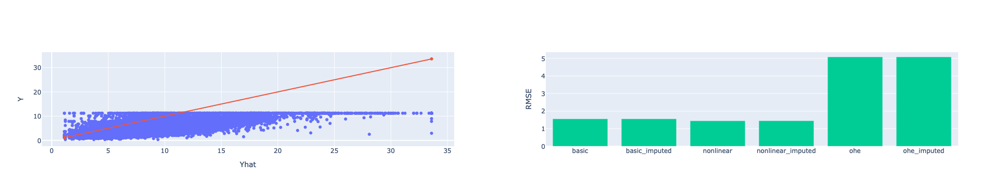

In [39]:
model = LinearRegression()
model.fit(ohe_imputed_design_matrix(train_data), train_data['income_2022_dollars'])
evaluate_model("ohe_imputed", model, ohe_imputed_design_matrix, models)

In [63]:
# Model evaluation code adapted from Dr. Homayouni
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

# Phi is the feature engineering function
def better_evaluate_model(name, model, phi, models=dict()):
    # run the prediction function and compute the RMSE
    Yhat_train = model.predict(phi(train_data)).flatten()
    Y_train = train_data['value_2022_dollars'].to_numpy()
    rmse_train = np.sqrt(mean_squared_error(Y_train, Yhat_train))
    print("Train Root Mean Squared Error:", rmse_train)

    Yhat_test = model.predict(phi(test_data)).flatten()
    Y_test = test_data['value_2022_dollars'].to_numpy()
    rmse_test = np.sqrt(mean_squared_error(Y_test, Yhat_test))
    print("Test Root Mean Squared Error:", rmse_test)

    # Save the model and rmse to the collection of models
    models[name] = dict(model=model, phi=phi, rmse_train=rmse_train, rmse_test=rmse_test)

    # Generate diagnostic and model comparison plots
    fig = make_subplots(rows=1, cols=2)
    fig.add_trace(go.Scatter(x=Yhat_test, y=Y_test, mode="markers"), row=1, col=1)
    fig.update_xaxes(title = "Predicted Median Value", row=1, col=1)
    fig.update_yaxes(title = "Median Value", row=1, col=1)
    ymin = np.min(Yhat_train)
    ymax = np.max(Yhat_train)
    fig.add_trace(go.Scatter(x=[ymin,ymax], y=[ymin,ymax], name="y=yhat"), row=1, col=1)
    fig.add_trace(go.Bar(x=list(models.keys()),
                         y=[models[k]['rmse_train'] for k in models]), row=1, col=2)
    fig.add_trace(go.Bar(x=list(models.keys()),
                         y=[models[k]['rmse_test'] for k in models]), row=1, col=2)
    fig.update_layout(showlegend=True)
    fig.update_yaxes(title = "RMSE", row=1, col=2)
    fig.show()

better_models = {}

In [44]:
basic_model = LinearRegression()
basic_model.fit(basic_imputed_design_matrix(train_data), train_data['value_2022_dollars'])

LinearRegression()

Train Root Mean Squared Error: 1.5591375006926256
Test Root Mean Squared Error: 1.5706152730647769


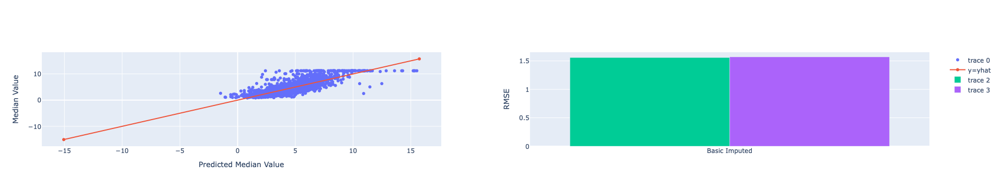

In [64]:
better_evaluate_model("Basic Imputed", basic_model, basic_imputed_design_matrix, better_models)

In [46]:
nonlinear_model = LinearRegression()
nonlinear_model.fit(nonlinear_imputed_design_matrix(train_data), train_data['value_2022_dollars'])

LinearRegression()

Train Root Mean Squared Error: 1.4563602902897994
Test Root Mean Squared Error: 1.4786788709161294


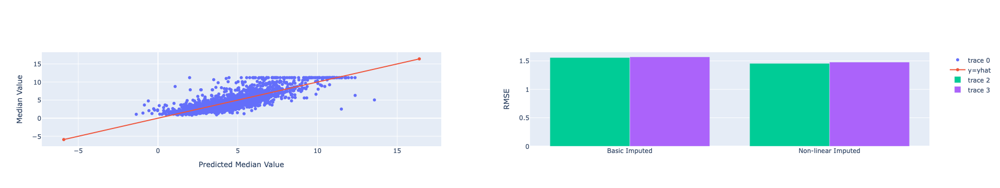

In [65]:
better_evaluate_model("Non-linear Imputed", nonlinear_model, nonlinear_imputed_design_matrix, better_models)

In [48]:
ohe_model = LinearRegression()
ohe_model.fit(ohe_imputed_design_matrix(train_data), train_data['income_2022_dollars'])

LinearRegression()

Train Root Mean Squared Error: 5.086375438862141
Test Root Mean Squared Error: 5.161431414489146


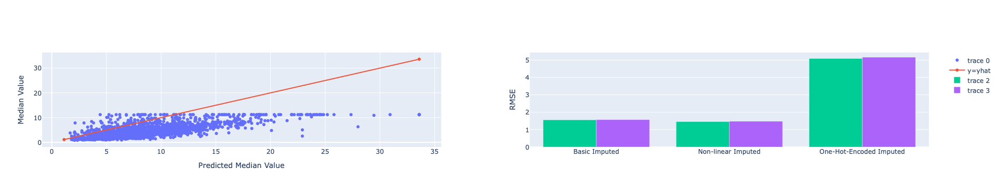

In [80]:
better_evaluate_model("One-Hot-Encoded Imputed", ohe_model, ohe_imputed_design_matrix, better_models)

## Train and Evaluate Final Model

In [81]:
final_model = LinearRegression()
final_model.fit(nonlinear_imputed_design_matrix(df), df['value_2022_dollars'])

LinearRegression()

In [82]:
# Phi is the feature engineering function
def final_evaluate_model(name, model, phi, models=dict()):
    # run the prediction function and compute the RMSE
    Yhat_train = model.predict(phi(df)).flatten()
    Y_train = df['value_2022_dollars'].to_numpy()
    rmse_train = np.sqrt(mean_squared_error(Y_train, Yhat_train))
    print("Train Root Mean Squared Error:", rmse_train)

    # Yhat_test = model.predict(phi(test_data)).flatten()
    # Y_test = test_data['value_2022_dollars'].to_numpy()
    # rmse_test = np.sqrt(mean_squared_error(Y_test, Yhat_test))
    # print("Test Root Mean Squared Error:", rmse_test)

    # Save the model and rmse to the collection of models
    models[name] = dict(model=model, phi=phi, rmse_train=rmse_train)

    # Generate diagnostic and model comparison plots
    fig = make_subplots(rows=1, cols=2)
    fig.add_trace(go.Scatter(x=Yhat_train, y=Y_train, mode="markers"), row=1, col=1)
    fig.update_xaxes(title = "Predicted Median Value", row=1, col=1)
    fig.update_yaxes(title = "Median Value", row=1, col=1)
    ymin = np.min(Yhat_train)
    ymax = np.max(Yhat_train)
    fig.add_trace(go.Scatter(x=[ymin,ymax], y=[ymin,ymax], name="y=yhat"), row=1, col=1)
    fig.add_trace(go.Bar(x=list(models.keys()),
                         y=[models[k]['rmse_train'] for k in models]), row=1, col=2)
    # fig.add_trace(go.Bar(x=list(models.keys()),
    #                      y=[models[k]['rmse_test'] for k in models]), row=1, col=2)
    fig.update_layout(showlegend=True)
    fig.update_yaxes(title = "RMSE", row=1, col=2)
    fig.show()

final_models = {}

Train Root Mean Squared Error: 1.4584576614294822


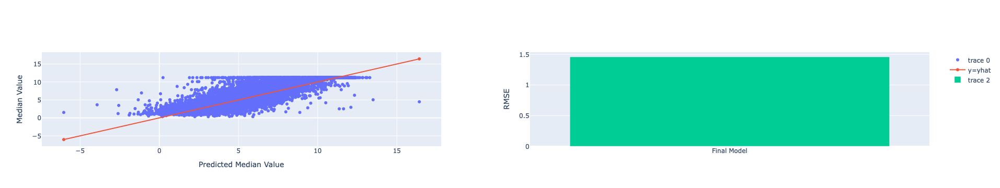

In [83]:
final_evaluate_model("Final Model", final_model, nonlinear_imputed_design_matrix, final_models)